# Initial SetUp

## Yolo Installation

In [1]:
!pip install super-gradients==3.1.0
!pip install imutils
!pip install pytube --upgrade

In [2]:
from super_gradients.training import models
from super_gradients.common.object_names import Models

The console stream is logged into /root/sg_logs/console.log


[2023-06-28 17:22:37] INFO - crash_tips_setup.py - Crash tips is enabled. You can set your environment variable to CRASH_HANDLER=FALSE to disable it
/usr/local/lib/python3.10/dist-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")
[2023-06-28 17:22:45] WARNING - __init__.py - Failed to import pytorch_quantization
[2023-06-28 17:22:45] WARNING - calibrator.py - Failed to import pytorch_quantization
[2023-06-28 17:22:45] WARNING - export.py - Failed to import pytorch_quantization
[2023-06-28 17:22:45] WARNING - selective_quantization_utils.py - Failed to import pytorch_quantization


In [3]:
from google.colab import drive
drive.mount('/content/drive')

## SAM Installation

In [4]:
# Install SAM
!pip install git+https://github.com/facebookresearch/segment-anything.git

Mounted at /content/drive
  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-6er_gqvk
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-6er_gqvk
  Resolved https://github.com/facebookresearch/segment-anything.git to commit 6fdee8f2727f4506cfbbe553e23b895e27956588
  Preparing metadata (setup.py) ... done
  Created wheel for segment-anything: filename=segment_anything-1.0-py3-none-any.whl size=36589 sha256=d412edc0ef2f324ac9e19a172a146ba3f5fa734f265190e3c26de83843a67479
  Stored in directory: /tmp/pip-ephem-wheel-cache-09l1_qxy/wheels/10/cf/59/9ccb2f0a1bcc81d4fbd0e501680b5d088d690c6cfbc02dc99d
Successfully built segment-anything


### Check for Cude

In [5]:
import torch
torch.__version__

'1.13.1+cu117'

In [6]:
torch.cuda.get_device_name(0)

'Tesla T4'

Helper Function

# Load Ip Image

In [7]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import cv2

In [8]:
image = cv2.imread('/content/drive/MyDrive/Colab_Notebooks/Computer Vision/SAM_SegmentAnything/input_images/test.jpeg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

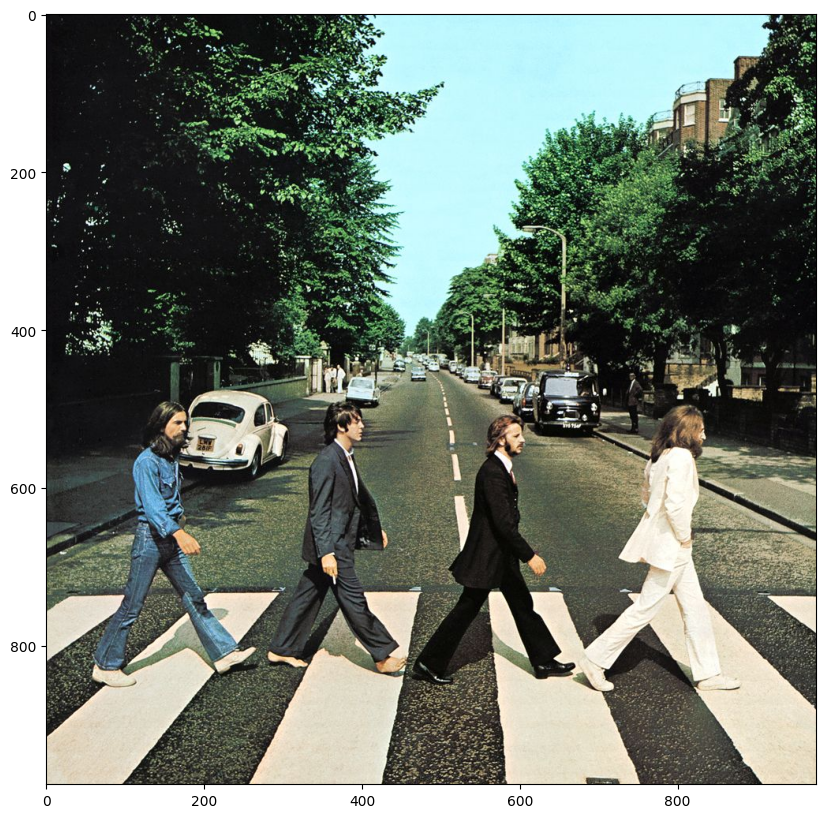

In [9]:
plt.figure(figsize=(10,10))

plt.imshow(image)

plt.axis('on')
plt.show()

# OD - YOLO_NAS

In [10]:
from super_gradients.training import models

yolo_nas_l = models.get("yolo_nas_l", pretrained_weights="coco")

[2023-06-28 17:23:20] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.


  0%|          | 0.00/256M [00:00<?, ?B/s]

Downloading: "https://sghub.deci.ai/models/yolo_nas_l_coco.pth" to /root/.cache/torch/hub/checkpoints/yolo_nas_l_coco.pth


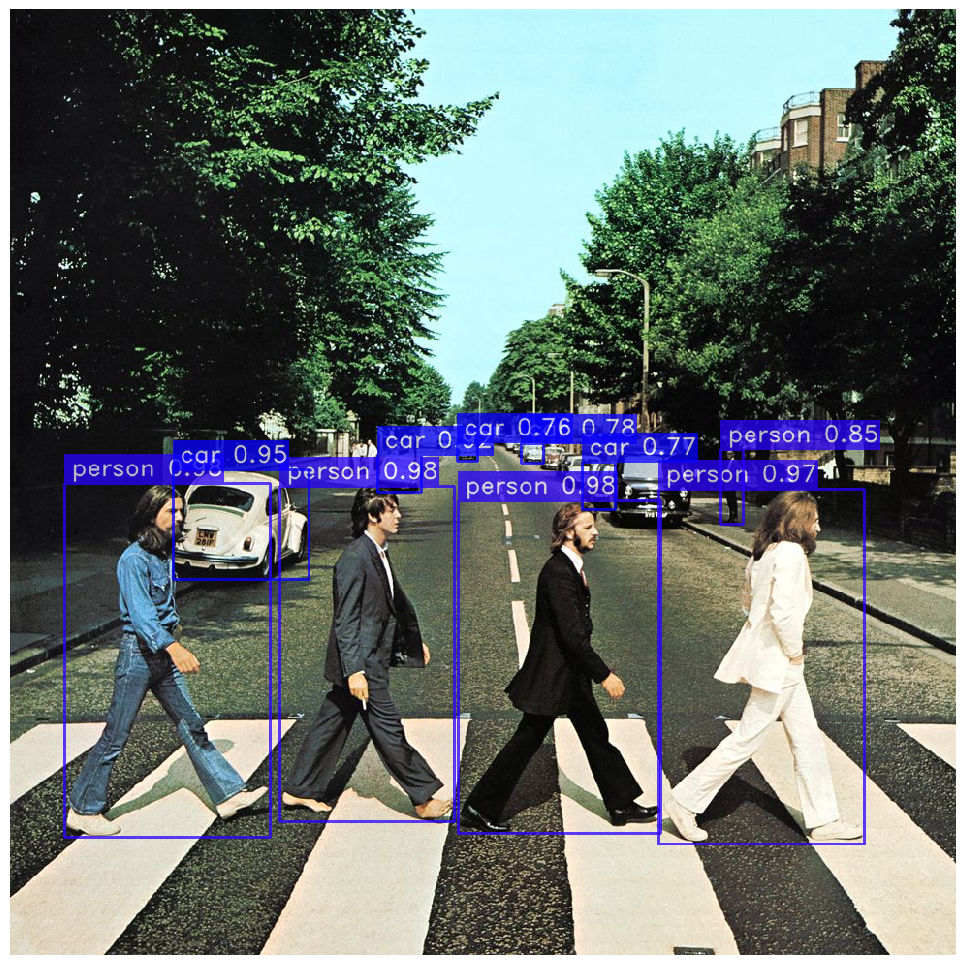

In [11]:
yolo_nas_l.predict(image, conf=0.75).show()

## Save to output folder

In [12]:
conf_threshold = 0.75
detection_pred = yolo_nas_l.predict(image, conf = conf_threshold)
detection = detection_pred.save('/content/drive/MyDrive/Colab_Notebooks/Computer Vision/SAM_SegmentAnything/output')

## Analyze NAS Prediction

In [13]:
pred = list(yolo_nas_l.predict(image, conf = conf_threshold)._images_prediction_lst)

In [14]:
pred

[ImageDetectionPrediction(image=array([[[ 15,  15,  17],
         [ 16,  16,  18],
         [ 15,  15,  17],
         ...,
         [ 66,  94,  69],
         [ 85, 120,  87],
         [ 52,  90,  53]],
 
        [[ 14,  14,  16],
         [ 16,  16,  18],
         [ 14,  14,  16],
         ...,
         [ 88, 118,  90],
         [110, 145, 112],
         [ 78, 116,  79]],
 
        [[ 14,  14,  16],
         [ 15,  15,  17],
         [ 14,  14,  16],
         ...,
         [ 71, 104,  75],
         [ 72, 109,  75],
         [ 66, 107,  67]],
 
        ...,
 
        [[219, 211, 190],
         [219, 211, 190],
         [219, 211, 190],
         ...,
         [219, 208, 180],
         [224, 213, 185],
         [229, 218, 190]],
 
        [[222, 214, 193],
         [219, 211, 190],
         [218, 210, 189],
         ...,
         [220, 209, 181],
         [224, 213, 185],
         [229, 218, 190]],
 
        [[225, 217, 196],
         [221, 213, 192],
         [217, 209, 188],
         ..

In [15]:
pred[0]

ImageDetectionPrediction(image=array([[[ 15,  15,  17],
        [ 16,  16,  18],
        [ 15,  15,  17],
        ...,
        [ 66,  94,  69],
        [ 85, 120,  87],
        [ 52,  90,  53]],

       [[ 14,  14,  16],
        [ 16,  16,  18],
        [ 14,  14,  16],
        ...,
        [ 88, 118,  90],
        [110, 145, 112],
        [ 78, 116,  79]],

       [[ 14,  14,  16],
        [ 15,  15,  17],
        [ 14,  14,  16],
        ...,
        [ 71, 104,  75],
        [ 72, 109,  75],
        [ 66, 107,  67]],

       ...,

       [[219, 211, 190],
        [219, 211, 190],
        [219, 211, 190],
        ...,
        [219, 208, 180],
        [224, 213, 185],
        [229, 218, 190]],

       [[222, 214, 193],
        [219, 211, 190],
        [218, 210, 189],
        ...,
        [220, 209, 181],
        [224, 213, 185],
        [229, 218, 190]],

       [[225, 217, 196],
        [221, 213, 192],
        [217, 209, 188],
        ...,
        [231, 220, 192],
        [233, 222,

In [16]:
pred[0].__dict__.keys()

dict_keys(['image', 'prediction', 'class_names'])

In [17]:
pred[0].prediction

DetectionPrediction(bboxes_xyxy=array([[462.83276 , 507.5756  , 671.809   , 850.35223 ],
       [ 56.867683, 489.58932 , 268.5912  , 854.3124  ],
       [278.931   , 492.3653  , 458.76447 , 838.0672  ],
       [669.5661  , 495.77176 , 881.3265  , 861.77905 ],
       [168.21709 , 475.82718 , 308.70975 , 588.96173 ],
       [379.53812 , 460.11356 , 424.31686 , 498.95743 ],
       [733.09125 , 454.05203 , 756.6601  , 531.0896  ],
       [527.51636 , 448.70926 , 550.77057 , 468.04825 ],
       [590.1622  , 467.08795 , 624.61505 , 516.3058  ],
       [461.48737 , 447.57574 , 482.36288 , 466.58826 ]], dtype=float32), confidence=array([0.9820203 , 0.97971195, 0.9780668 , 0.9681691 , 0.9485164 ,
       0.9169066 , 0.8534786 , 0.7807163 , 0.76567423, 0.76393956],
      dtype=float32), labels=array([0., 0., 0., 0., 2., 2., 0., 2., 2., 2.], dtype=float32))

In [18]:
pred[0].prediction.__dict__.keys()

dict_keys(['bboxes_xyxy', 'confidence', 'labels'])

In [19]:
pred[0].prediction.bboxes_xyxy

array([[462.83276 , 507.5756  , 671.809   , 850.35223 ],
       [ 56.867683, 489.58932 , 268.5912  , 854.3124  ],
       [278.931   , 492.3653  , 458.76447 , 838.0672  ],
       [669.5661  , 495.77176 , 881.3265  , 861.77905 ],
       [168.21709 , 475.82718 , 308.70975 , 588.96173 ],
       [379.53812 , 460.11356 , 424.31686 , 498.95743 ],
       [733.09125 , 454.05203 , 756.6601  , 531.0896  ],
       [527.51636 , 448.70926 , 550.77057 , 468.04825 ],
       [590.1622  , 467.08795 , 624.61505 , 516.3058  ],
       [461.48737 , 447.57574 , 482.36288 , 466.58826 ]], dtype=float32)

In [20]:
pred[0].prediction.bboxes_xyxy.shape

(10, 4)

In [21]:
pred[0].prediction.labels

array([0., 0., 0., 0., 2., 2., 0., 2., 2., 2.], dtype=float32)

In [22]:
pred[0].prediction.confidence

array([0.9820203 , 0.97971195, 0.9780668 , 0.9681691 , 0.9485164 ,
       0.9169066 , 0.8534786 , 0.7807163 , 0.76567423, 0.76393956],
      dtype=float32)

# SAM

### SAM SETUP

In [23]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import cv2

In [24]:
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)

def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)

def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0,0,0,0), lw=2))

# Automatic mask generation
def show_anns(anns):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    img[:,:,3] = 0
    for ann in sorted_anns:
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.35]])
        img[m] = color_mask
    ax.imshow(img)

In [25]:
from segment_anything import sam_model_registry, SamPredictor
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor

sam_checkpoint = "/content/drive/MyDrive/Colab_Notebooks/Computer Vision/SAM_SegmentAnything/weights/sam_vit_h_4b8939.pth"
model_type = "vit_h"

device = "cuda"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)

predictor = SamPredictor(sam)
mask_generator = SamAutomaticMaskGenerator(sam)


In [26]:
#Image Embedding
predictor.set_image(image)

# Auto mask
masks = mask_generator.generate(image)

### Bouding Box

In [27]:
# input_box = np.array([420, 500, 500, 800]) # box coordinates


# bb_masks, bb_scores, bb_logits = predictor.predict(
#     point_coords=None,
#     point_labels=None,
#     # Box ip
#     box=input_box[None, :],
#     multimask_output=False,
# )

In [28]:
# plt.figure(figsize=(10, 10))
# plt.imshow(image)

# show_mask(bb_masks[0], plt.gca())
# show_box(input_box, plt.gca())

# plt.title(f"Score: {bb_scores[0]:.3f}", fontsize=18)
# plt.axis('off')
# plt.show()

## Automask

In [29]:
masks

[{'segmentation': array([[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]]),
  'area': 88703,
  'bbox': [417, 0, 495, 402],
  'predicted_iou': 1.0403919219970703,
  'point_coords': [[533.75, 320.25]],
  'stability_score': 0.9803647994995117,
  'crop_box': [0, 0, 976, 976]},
 {'segmentation': array([[ True,  True,  True, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]]),
  'area': 186171,
  'bbox': [0, 0, 496, 43

In [30]:
len(masks)

114

In [31]:
masks[0].keys()

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])

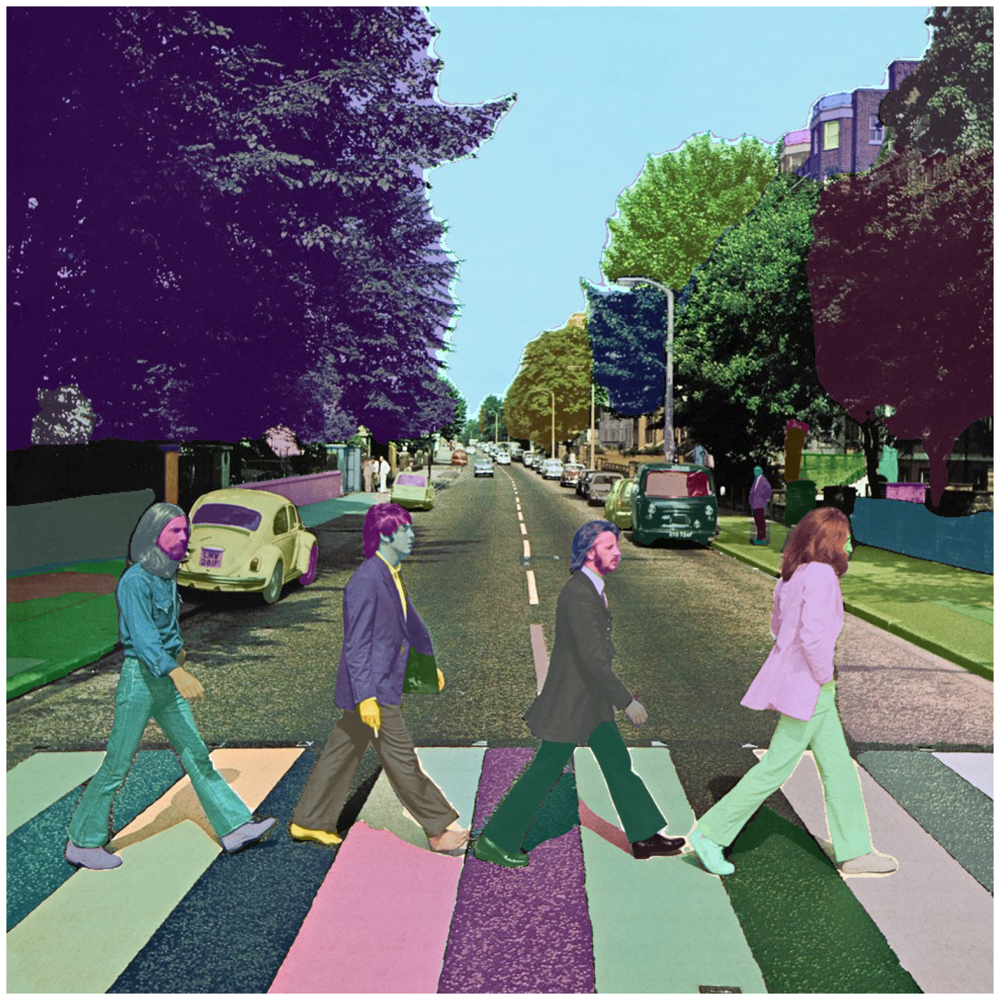

In [32]:
plt.figure(figsize=(20,20))
plt.imshow(image)

show_anns(masks)

plt.axis('off')
plt.show()

# YOLO_NAS + SAM = For segmenting and detecting specific class

Steps:
1. Object detection using NAS.
2.Provide Bounding Box Coordinates to SAM.
3. SAM provides mask.


## NAS

In [33]:
from super_gradients.training import models

model_nas = models.get("yolo_nas_l", pretrained_weights="coco")
conf_threshold = 0.25


[2023-06-28 17:24:48] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.


In [34]:
model_pred = list(model_nas.predict(image, conf = conf_threshold)._images_prediction_lst)

### Analyze

In [35]:
model_pred[0].__dict__.keys()

dict_keys(['image', 'prediction', 'class_names'])

In [36]:
model_pred[0].prediction.__dict__.keys()

dict_keys(['bboxes_xyxy', 'confidence', 'labels'])

## Get 'bboxes_xyxy', 'confidence', 'labels'.

In [37]:
bboxes_xyxy = model_pred[0].prediction.bboxes_xyxy.tolist()
bboxes_xyxy

[[462.832763671875, 507.5755920410156, 671.8090209960938, 850.3522338867188],
 [56.86768341064453, 489.5893249511719, 268.5911865234375, 854.3123779296875],
 [278.9309997558594,
  492.36529541015625,
  458.76446533203125,
  838.0671997070312],
 [669.5661010742188, 495.7717590332031, 881.3264770507812, 861.779052734375],
 [168.2170867919922, 475.8271789550781, 308.7097473144531, 588.9617309570312],
 [379.5381164550781, 460.1135559082031, 424.3168640136719, 498.9574279785156],
 [733.0912475585938, 454.0520324707031, 756.6600952148438, 531.089599609375],
 [527.516357421875, 448.7092590332031, 550.7705688476562, 468.0482482910156],
 [590.1621704101562, 467.08795166015625, 624.6150512695312, 516.3057861328125],
 [461.48736572265625,
  447.57574462890625,
  482.3628845214844,
  466.5882568359375],
 [616.0902099609375, 452.02154541015625, 705.0045776367188, 535.0720825195312],
 [573.2367553710938, 461.48553466796875, 610.3642578125, 494.98583984375],
 [547.2256469726562, 451.490234375, 572.27

In [38]:
# Extract desired outputs
bboxes_xyxy = model_pred[0].prediction.bboxes_xyxy.tolist()
confidence = model_pred[0].prediction.confidence.tolist()
labels = model_pred[0].prediction.labels.tolist()

In [39]:
bboxes_xyxy

[[462.832763671875, 507.5755920410156, 671.8090209960938, 850.3522338867188],
 [56.86768341064453, 489.5893249511719, 268.5911865234375, 854.3123779296875],
 [278.9309997558594,
  492.36529541015625,
  458.76446533203125,
  838.0671997070312],
 [669.5661010742188, 495.7717590332031, 881.3264770507812, 861.779052734375],
 [168.2170867919922, 475.8271789550781, 308.7097473144531, 588.9617309570312],
 [379.5381164550781, 460.1135559082031, 424.3168640136719, 498.9574279785156],
 [733.0912475585938, 454.0520324707031, 756.6600952148438, 531.089599609375],
 [527.516357421875, 448.7092590332031, 550.7705688476562, 468.0482482910156],
 [590.1621704101562, 467.08795166015625, 624.6150512695312, 516.3057861328125],
 [461.48736572265625,
  447.57574462890625,
  482.3628845214844,
  466.5882568359375],
 [616.0902099609375, 452.02154541015625, 705.0045776367188, 535.0720825195312],
 [573.2367553710938, 461.48553466796875, 610.3642578125, 494.98583984375],
 [547.2256469726562, 451.490234375, 572.27

In [40]:
confidence


[0.9820203185081482,
 0.9797119498252869,
 0.9780668020248413,
 0.968169093132019,
 0.9485164284706116,
 0.9169065952301025,
 0.8534786105155945,
 0.7807163000106812,
 0.7656742334365845,
 0.7639395594596863,
 0.6917734742164612,
 0.6590172648429871,
 0.5759915709495544,
 0.5322229266166687,
 0.5042703151702881,
 0.4315200448036194,
 0.37251946330070496,
 0.36993351578712463,
 0.3643721640110016,
 0.3514643609523773,
 0.34235280752182007,
 0.33937206864356995,
 0.3151647448539734,
 0.30274975299835205,
 0.3015941083431244,
 0.2880326509475708,
 0.2688751518726349]

In [41]:
labels

[0.0,
 0.0,
 0.0,
 0.0,
 2.0,
 2.0,
 0.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 0.0,
 2.0,
 2.0,
 0.0,
 27.0,
 7.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0]

## SAM

In [42]:
sam_checkpoint = "/content/drive/MyDrive/Colab_Notebooks/Computer Vision/SAM_SegmentAnything/weights/sam_vit_h_4b8939.pth"
model_type = "vit_h"

device = "cuda"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)

predictor = SamPredictor(sam)
masks = mask_generator.generate(image)

In [43]:
predictor.set_image(image)

### List to Tensor object

In [44]:
tensor_box = torch.tensor(bboxes_xyxy, device=predictor.device)

In [45]:
tensor_box

tensor([[462.8328, 507.5756, 671.8090, 850.3522],
        [ 56.8677, 489.5893, 268.5912, 854.3124],
        [278.9310, 492.3653, 458.7645, 838.0672],
        [669.5661, 495.7718, 881.3265, 861.7791],
        [168.2171, 475.8272, 308.7097, 588.9617],
        [379.5381, 460.1136, 424.3169, 498.9574],
        [733.0912, 454.0520, 756.6601, 531.0896],
        [527.5164, 448.7093, 550.7706, 468.0482],
        [590.1622, 467.0880, 624.6151, 516.3058],
        [461.4874, 447.5757, 482.3629, 466.5883],
        [616.0902, 452.0215, 705.0046, 535.0721],
        [573.2368, 461.4855, 610.3643, 494.9858],
        [547.2256, 451.4902, 572.2769, 475.6017],
        [438.7137, 438.8766, 455.9514, 454.3934],
        [366.9604, 443.6497, 379.7654, 480.0072],
        [481.5218, 440.3981, 498.3700, 453.0855],
        [478.2882, 438.4720, 497.3742, 453.4351],
        [351.2972, 446.4931, 364.9076, 480.8127],
        [379.4265, 555.0085, 398.7339, 625.5873],
        [616.0270, 451.8561, 704.8505, 535.3083],


In [46]:
transformed_boxes = predictor.transform.apply_boxes_torch(tensor_box, image.shape[:2])

In [47]:
transformed_boxes

tensor([[485.5950, 532.5383, 704.8488, 892.1728],
        [ 59.6645, 513.6675, 281.8006, 896.3277],
        [292.6489, 516.5800, 481.3266, 879.2836],
        [702.4955, 520.1539, 924.6703, 904.1616],
        [176.4901, 499.2285, 323.8922, 617.9270],
        [398.2039, 482.7421, 445.1849, 523.4963],
        [769.1449, 476.3824, 793.8729, 557.2087],
        [553.4598, 470.7769, 577.8576, 491.0670],
        [619.1865, 490.0594, 655.3338, 541.6978],
        [484.1834, 469.5876, 506.0856, 489.5352],
        [646.3897, 474.2521, 739.6769, 561.3871],
        [601.4287, 484.1815, 640.3821, 519.3294],
        [574.1384, 473.6946, 600.4216, 498.9920],
        [460.2898, 460.4607, 478.3752, 476.7406],
        [385.0076, 465.4685, 398.4424, 503.6140],
        [505.2032, 462.0570, 522.8799, 475.3683],
        [501.8105, 460.0361, 521.8351, 475.7351],
        [368.5741, 468.4517, 382.8538, 504.4592],
        [398.0868, 582.3040, 418.3437, 656.3538],
        [646.3234, 474.0785, 739.5153, 561.6349],


In [48]:
batch_masks, batch_scores, batch_logits = predictor.predict_torch(
    point_coords=None,
    point_labels=None,
    boxes=transformed_boxes,
    multimask_output=False,
)

In [49]:
batch_masks.shape # (batch_size) x (num_predicted_masks_per_input) x H x W

torch.Size([27, 1, 976, 976])

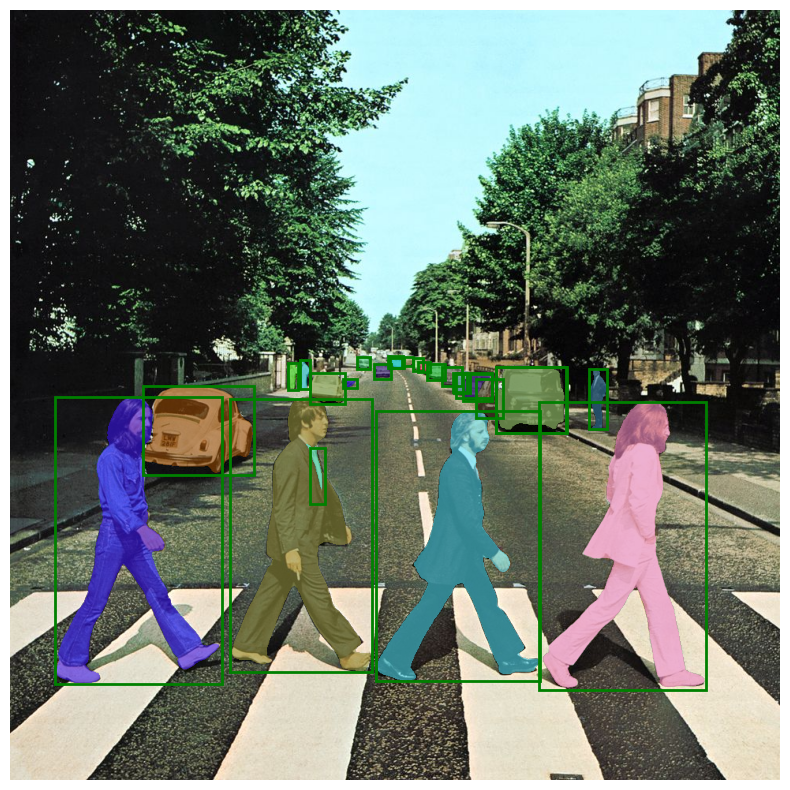

In [50]:
plt.figure(figsize=(10, 10))
plt.imshow(image)

for mask in batch_masks:
    show_mask(mask.cpu().numpy(), plt.gca(), random_color=True)

for box in tensor_box:
    show_box(box.cpu().numpy(), plt.gca())

plt.axis('off')
plt.savefig('my_image.jpg')
plt.show()


# OpenCV + NAS + SAM

In [51]:
device = 'cuda' if torch.cuda.is_available() else "cpu"
result = list(model_nas.predict(image, conf = conf_threshold))[0]

In [52]:
result

ImageDetectionPrediction(image=array([[[ 15,  15,  17],
        [ 16,  16,  18],
        [ 15,  15,  17],
        ...,
        [ 66,  94,  69],
        [ 85, 120,  87],
        [ 52,  90,  53]],

       [[ 14,  14,  16],
        [ 16,  16,  18],
        [ 14,  14,  16],
        ...,
        [ 88, 118,  90],
        [110, 145, 112],
        [ 78, 116,  79]],

       [[ 14,  14,  16],
        [ 15,  15,  17],
        [ 14,  14,  16],
        ...,
        [ 71, 104,  75],
        [ 72, 109,  75],
        [ 66, 107,  67]],

       ...,

       [[219, 211, 190],
        [219, 211, 190],
        [219, 211, 190],
        ...,
        [219, 208, 180],
        [224, 213, 185],
        [229, 218, 190]],

       [[222, 214, 193],
        [219, 211, 190],
        [218, 210, 189],
        ...,
        [220, 209, 181],
        [224, 213, 185],
        [229, 218, 190]],

       [[225, 217, 196],
        [221, 213, 192],
        [217, 209, 188],
        ...,
        [231, 220, 192],
        [233, 222,

## Get class Names

In [60]:
class_names = result.class_names

In [61]:
class_names

['person',
 'bicycle',
 'car',
 'motorcycle',
 'airplane',
 'bus',
 'train',
 'truck',
 'boat',
 'traffic light',
 'fire hydrant',
 'stop sign',
 'parking meter',
 'bench',
 'bird',
 'cat',
 'dog',
 'horse',
 'sheep',
 'cow',
 'elephant',
 'bear',
 'zebra',
 'giraffe',
 'backpack',
 'umbrella',
 'handbag',
 'tie',
 'suitcase',
 'frisbee',
 'skis',
 'snowboard',
 'sports ball',
 'kite',
 'baseball bat',
 'baseball glove',
 'skateboard',
 'surfboard',
 'tennis racket',
 'bottle',
 'wine glass',
 'cup',
 'fork',
 'knife',
 'spoon',
 'bowl',
 'banana',
 'apple',
 'sandwich',
 'orange',
 'broccoli',
 'carrot',
 'hot dog',
 'pizza',
 'donut',
 'cake',
 'chair',
 'couch',
 'potted plant',
 'bed',
 'dining table',
 'toilet',
 'tv',
 'laptop',
 'mouse',
 'remote',
 'keyboard',
 'cell phone',
 'microwave',
 'oven',
 'toaster',
 'sink',
 'refrigerator',
 'book',
 'clock',
 'vase',
 'scissors',
 'teddy bear',
 'hair drier',
 'toothbrush']

## Get the BBOX, Confidence, Class Label

In [53]:
# bounding box coordinates
bbox_xyxy_cord = result.prediction.bboxes_xyxy.tolist()

In [54]:
bbox_xyxy_cord

[[462.832763671875, 507.5755920410156, 671.8090209960938, 850.3522338867188],
 [56.86768341064453, 489.5893249511719, 268.5911865234375, 854.3123779296875],
 [278.9309997558594,
  492.36529541015625,
  458.76446533203125,
  838.0671997070312],
 [669.5661010742188, 495.7717590332031, 881.3264770507812, 861.779052734375],
 [168.2170867919922, 475.8271789550781, 308.7097473144531, 588.9617309570312],
 [379.5381164550781, 460.1135559082031, 424.3168640136719, 498.9574279785156],
 [733.0912475585938, 454.0520324707031, 756.6600952148438, 531.089599609375],
 [527.516357421875, 448.7092590332031, 550.7705688476562, 468.0482482910156],
 [590.1621704101562, 467.08795166015625, 624.6150512695312, 516.3057861328125],
 [461.48736572265625,
  447.57574462890625,
  482.3628845214844,
  466.5882568359375],
 [616.0902099609375, 452.02154541015625, 705.0045776367188, 535.0720825195312],
 [573.2367553710938, 461.48553466796875, 610.3642578125, 494.98583984375],
 [547.2256469726562, 451.490234375, 572.27

In [55]:
# confidence score
confidence_score = result.prediction.confidence

In [56]:
confidence_score

array([0.9820203 , 0.97971195, 0.9780668 , 0.9681691 , 0.9485164 ,
       0.9169066 , 0.8534786 , 0.7807163 , 0.76567423, 0.76393956,
       0.6917735 , 0.65901726, 0.5759916 , 0.5322229 , 0.5042703 ,
       0.43152004, 0.37251946, 0.36993352, 0.36437216, 0.35146436,
       0.3423528 , 0.33937207, 0.31516474, 0.30274975, 0.3015941 ,
       0.28803265, 0.26887515], dtype=float32)

In [57]:
# label
class_labels = result.prediction.labels.tolist()

In [58]:
class_labels

[0.0,
 0.0,
 0.0,
 0.0,
 2.0,
 2.0,
 0.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 0.0,
 2.0,
 2.0,
 0.0,
 27.0,
 7.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0,
 2.0]

# Add Labels

In [62]:
import math

In [69]:
for (bbox_xyxy, confidence, cls) in zip(bbox_xyxy_cord, confidence_score, class_labels):
  bbox = np.array(bbox_xyxy)
  x1, y1, x2, y2 = bbox[0], bbox[1], bbox[2], bbox[3]

  # convert to integer
  x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)

  # confidence
  conf = math.ceil((confidence * 100)) / 100
  # print("conf: ", conf)

  # label
  class_integer = int(cls)
  # class_integer = 0 -> mask_worn_incorrect ,1 -> 'with_mask', 2 - > 'without_mask
  cls_name = class_names[class_integer]

  # combine class name and confidence score
  label = f'{cls_name}{","}{conf}'
  # print(label)

  # text size of label and confidence
  # https://answers.opencv.org/question/7947/calculate-font-scale-to-fit-text-in-the-box/
  font = 0
  fontScale = 0.6
  thickness = 1
  # t_size, _ = cv2.getTextSize('Test', font, fontScale, thickness)
  t_size = cv2.getTextSize(label, font, fontScale, thickness)[0]
  weight_height = x1 + t_size[0] , y1 - t_size[1] - 3

  # display the label box and confidence
  # label and confidence score
  # cv2.rectangle(image, (x1, y1), weight_height, [255, 0, 255], -1, cv2.LINE_AA) # filled
  cv2.putText(image, label, (x1, y1 - 2), 0, 0.6, [255, 0, 0], thickness = 1, lineType = cv2.LINE_AA)

# ADD MASK

In [70]:
tensor_box_cv2 = torch.tensor(bbox_xyxy_cord, device=predictor.device)

In [71]:
transformed_boxes_cv2 = predictor.transform.apply_boxes_torch(tensor_box_cv2, image.shape[:2])


In [72]:
batch_masks, batch_scores, batch_logits = predictor.predict_torch(
    point_coords=None,
    point_labels=None,
    boxes=transformed_boxes_cv2,
    multimask_output=False,
)

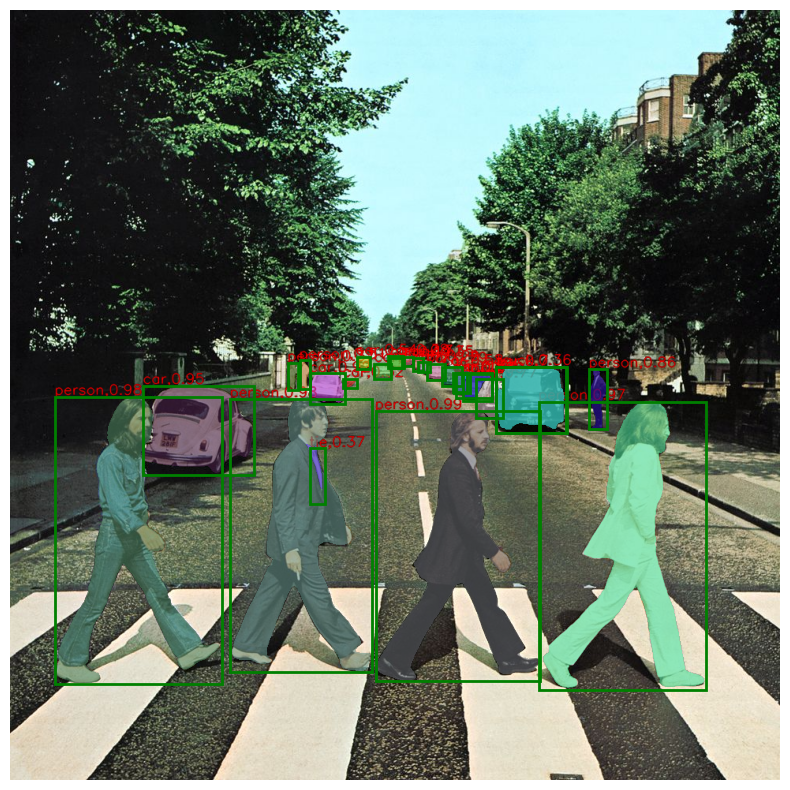

In [73]:
plt.figure(figsize=(10, 10))
plt.imshow(image)

for mask in batch_masks:
    show_mask(mask.cpu().numpy(), plt.gca(), random_color=True)

for box in tensor_box:
    show_box(box.cpu().numpy(), plt.gca())

plt.axis('off')
plt.savefig('my_image.jpg')
plt.show()